In [ ]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

from PIL import Image, ImageEnhance
import cv2

import os
import datetime
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import torch
import math
import pickle
import pandas as pd
import copy
import networkx as nx

from os import listdir
from os.path import isfile, join
from natsort import natsorted
from skimage.segmentation import mark_boundaries

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (20,15)

# Implemented imports
import sys
sys.path.append('../')
from proposed_method_lib.graph import segment_images, plot_nx_graph, save_graphs_to_file, save_item_with_pickle, load_item_with_pickle, get_indices_and_labels_for_time_frame_without_labels
from proposed_method_lib.graph_node import create_time_series_graphs, get_nx_graph_fast, get_all_possible_graphs_fast, join_graphs_if_joint_nodes, is_segment_classified_with_only_one_class, get_segment_raw_image, get_features, add_spatial_connections_to_graphs, update_nx_graph_features

from numba.typed import List, Dict
from numba import njit, jit

import json

from networkx.algorithms.operators.all import compose_all
from scipy.stats import mode

In [2]:
def perform_argmax_labels(labels, segmentation_masks):
    # Create an output array of the same shape as labels to store the new labels
    output_labels = np.zeros_like(labels)

    for t in range(0, segmentation_masks.shape[0]):
        if t % 10 == 0:
            print("Working on #", str(t+1), "/", segmentation_masks.shape[0])
        # Get unique segment ids (assuming they are consistent across time)
        segment_ids = np.unique(segmentation_masks[t])
    
        # Iterate over each segment ID
        for segment_id in segment_ids:
            # Create a mask for the current segment across all time slices
            segment_mask = segmentation_masks[t] == segment_id
    
            # Extract labels corresponding to the current segment across all time slices
            segment_labels = labels[t][segment_mask]
    
            # Calculate the most frequent label (mode) in the segment across all time slices
            most_frequent_label = mode(segment_labels, axis=None, keepdims=True).mode[0]
    
            # Assign the most frequent label to the entire segment in the output for all time slices
            output_labels[t][segment_mask] = most_frequent_label

    return output_labels

## Segmentation parameters

In [3]:
algorithm = "felzenszwalb"
scale = 10
sigma = 1.0
min_size = 50
channel_axis = 2

## Bounding box/feature parameters

In [4]:
# Per-node bounding box parameters
around_region_padding_amount = 32 # Amount of padding around each segment
desired_img_size = 32 # Rescaled bbox size (width * height)
RGB_or_RGB_plus_near_INFRARED = "rgb_plus_infrared" # Use only RGB channels (set to "only_rgb") OR also include infrared channel (set to "rgb_plus_infrared")

if RGB_or_RGB_plus_near_INFRARED not in ["only_rgb", "rgb_plus_infrared"]:
    raise Exception("Incorrect value for parameter RGB_or_RGB_plus_near_INFRARED")

keep_interval = "monthly" # Interval of images - we only focused on 'monthly', but further changes could be made to support 'weekly' or 'daily' images

if keep_interval != "monthly":
    raise Exception("Incorrect value for parameter keep_interval: We don't support daily or weekly data yet, only monthly!")

## Graph creation

In [5]:
with open('../../../../0_prepare_dynamic_earth_net_data/dynamic_earth_net_splits_info.json') as f:
    dataset_json = json.load(f)

dates_with_labels = [ # Labels/Ground truth semantic segmentation is provided only for the 1st of each month
    "2018_01_01",
    "2018_02_01",
    "2018_03_01",
    "2018_04_01",
    "2018_05_01",
    "2018_06_01",
    "2018_07_01",
    "2018_08_01",
    "2018_09_01",
    "2018_10_01",
    "2018_11_01",
    "2018_12_01",
    "2019_01_01",
    "2019_02_01",
    "2019_03_01",
    "2019_04_01",
    "2019_05_01",
    "2019_06_01",
    "2019_07_01",
    "2019_08_01",
    "2019_09_01",
    "2019_10_01",
    "2019_11_01",
    "2019_12_01"
]

Skipping test set: 1286_2921_13 because I don't need it!
Working on # 2 / 75 : 1311_3077_13
Folder './prepared_data/interval_monthly_padding_32_bbox_size_32_layers_rgb_plus_infrared_sc_10_sigma_1.0_min_size_50/train/1311_3077_13' was created.
Read raw shape: (24, 1024, 1024, 4) / read labels shape: (24, 1024, 1024)
Classes in labels [0 2 4 5]
Running segmentation...
Using algorithm felzenszwalb
Segmenting image # 1


C:\Users\Domen\anaconda3\envs\deep_learning_pytorch2.0\lib\site-packages\skimage\_shared\utils.py:427: RuntimeWarning: Got image with third dimension of 4. This image will be interpreted as a multichannel 2d image, which may not be intended.
  out = func(*new_args, **kwargs)


Correcting labels for indices: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
Performing argmax on labels...
Working on # 1 / 24
Working on # 11 / 24
Working on # 21 / 24


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.06881923886837367..5.22690511795404].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.22690511795404].


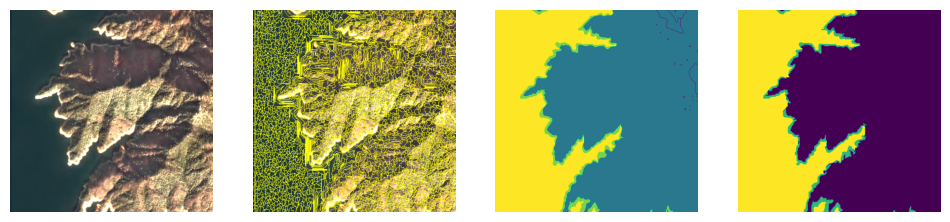

Kept classes in labels: [0 2 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4087


E:\doktorat2\methods\my_method\pipeline\2_perform_segmentation_and_data_preparation\../..\my_code\graph_node.py:753: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  index = np.array(new_index)


Working on segment # 200 / 4087
Working on segment # 400 / 4087
Working on segment # 600 / 4087
Working on segment # 800 / 4087
Working on segment # 1000 / 4087
Working on segment # 1200 / 4087
Working on segment # 1400 / 4087
Working on segment # 1600 / 4087
Working on segment # 1800 / 4087
Working on segment # 2000 / 4087
Working on segment # 2200 / 4087
Working on segment # 2400 / 4087
Working on segment # 2600 / 4087
Working on segment # 2800 / 4087
Working on segment # 3000 / 4087
Working on segment # 3200 / 4087
Working on segment # 3400 / 4087
Working on segment # 3600 / 4087
Working on segment # 3800 / 4087
Working on segment # 4000 / 4087
Step 0 - number of graphs created: 4087
Working on time frame # 1
Working on segment # 0 / 4196
Working on segment # 200 / 4196
Working on segment # 400 / 4196
Working on segment # 600 / 4196
Working on segment # 800 / 4196
Working on segment # 1000 / 4196
Working on segment # 1200 / 4196
Working on segment # 1400 / 4196
Working on segment # 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.250099185155797..11.680806909390544].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..11.680806909390544].


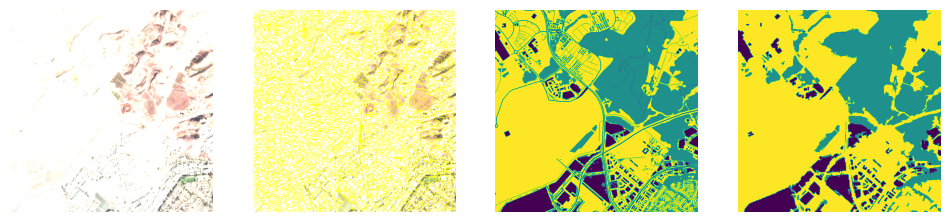

Kept classes in labels: [0 1 2 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4597
Working on segment # 200 / 4597
Working on segment # 400 / 4597
Working on segment # 600 / 4597
Working on segment # 800 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.750297555467391..3.0364391003143405].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..3.0364391003143405].


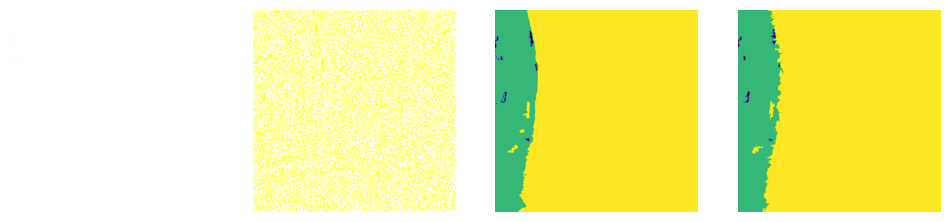

Kept classes in labels: [2 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4716
Working on segment # 200 / 4716
Working on segment # 400 / 4716
Working on segment # 600 / 4716
Working on segment # 800 / 47

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.250099185155797..9.728690450758386].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..9.728690450758386].


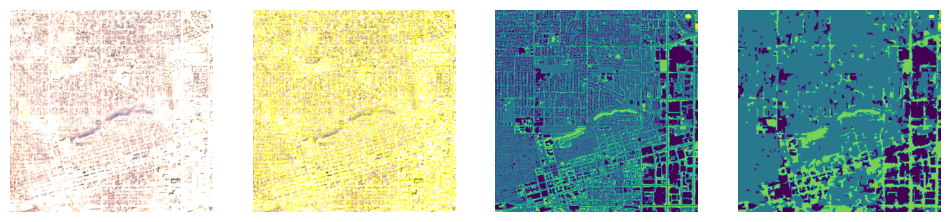

Kept classes in labels: [0 2 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4932
Working on segment # 200 / 4932
Working on segment # 400 / 4932
Working on segment # 600 / 4932
Working on segment # 800 / 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03860591448713645..8.05520798364208].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..8.05520798364208].


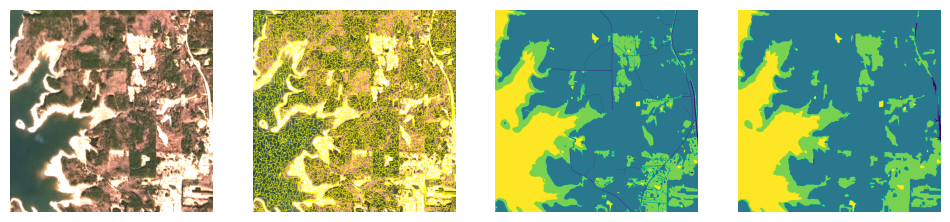

Kept classes in labels: [0 2 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4490
Working on segment # 200 / 4490
Working on segment # 400 / 4490
Working on segment # 600 / 4490
Working on segment # 800 / 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.1393169957579272..9.844508194219793].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..9.844508194219793].


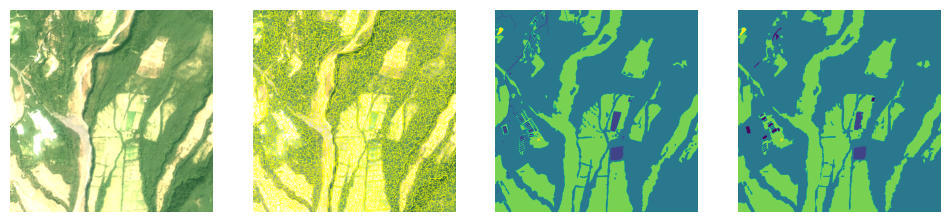

Kept classes in labels: [0 1 2 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4767
Working on segment # 200 / 4767
Working on segment # 400 / 4767
Working on segment # 600 / 4767
Working on segment # 800 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.13092440565202795..1.0927152317880795].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0927152317880795].


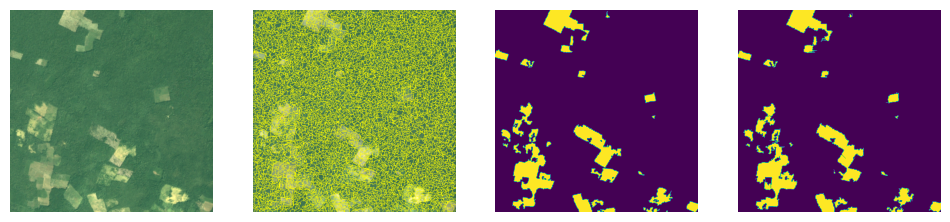

Kept classes in labels: [2 4]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 5356
Working on segment # 200 / 5356
Working on segment # 400 / 5356
Working on segment # 600 / 5356
Working on segment # 800 / 5356

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.08560441908017212..6.861781670583209].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..6.84667500839259].


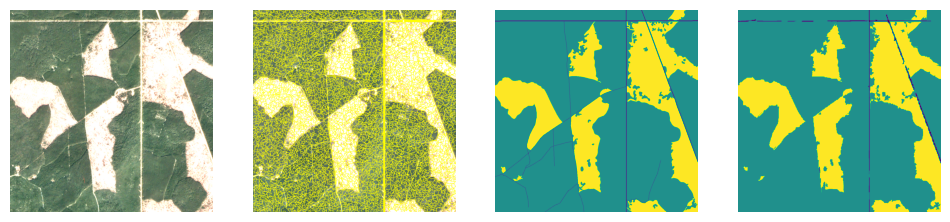

Kept classes in labels: [0 2 4]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4873
Working on segment # 200 / 4873
Working on segment # 400 / 4873
Working on segment # 600 / 4873
Working on segment # 800 / 48

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.20310068056276132..5.314188055055391].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.314188055055391].


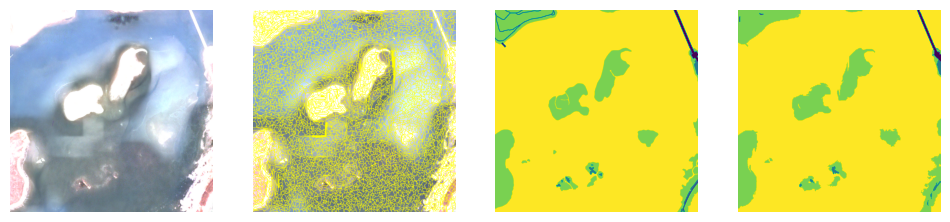

Kept classes in labels: [0 2 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4537
Working on segment # 200 / 4537
Working on segment # 400 / 4537
Working on segment # 600 / 4537
Working on segment # 800 / 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.1477095858638264..10.149998474074525].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..10.149998474074525].


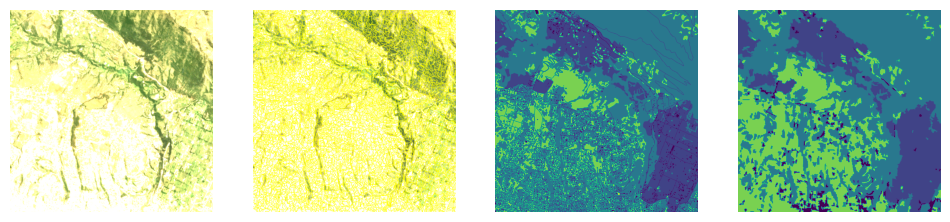

Kept classes in labels: [0 1 2 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4715
Working on segment # 200 / 4715
Working on segment # 400 / 4715
Working on segment # 600 / 4715
Working on segment # 800 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.10910367137668996..13.829309976500749].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..13.829309976500749].


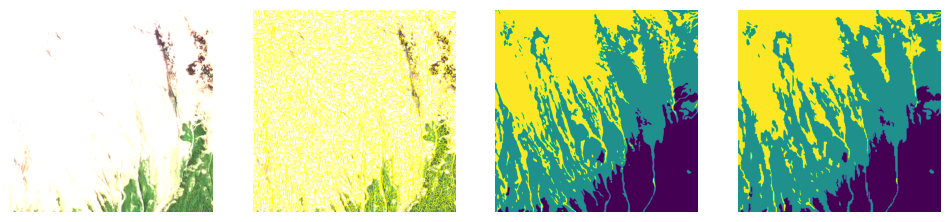

Kept classes in labels: [2 4 6]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4216
Working on segment # 200 / 4216
Working on segment # 400 / 4216
Working on segment # 600 / 4216
Working on segment # 800 / 42

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.38773766289254435..10.53102206488235].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..10.53102206488235].


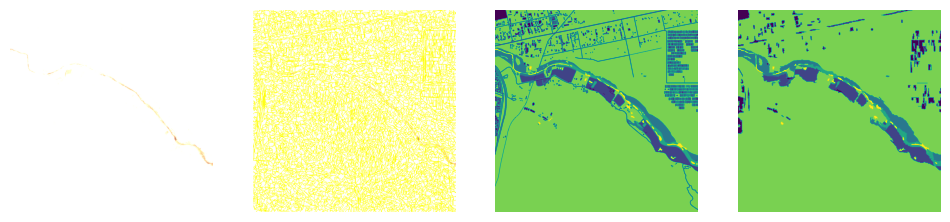

Kept classes in labels: [0 1 2 3 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4790
Working on segment # 200 / 4790
Working on segment # 400 / 4790
Working on segment # 600 / 4790
Working on segment # 80

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.08224738303781243..7.244483779412214].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..7.244483779412214].


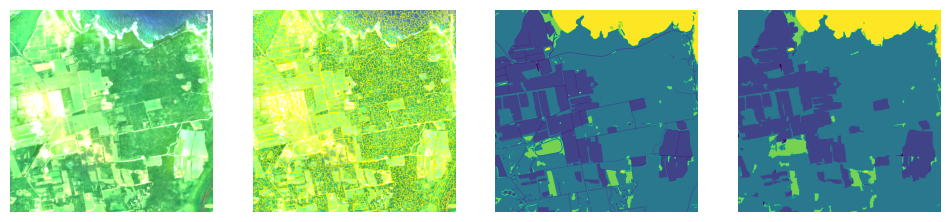

Kept classes in labels: [0 1 2 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4667
Working on segment # 200 / 4667
Working on segment # 400 / 4667
Working on segment # 600 / 4667
Working on segment # 800 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03189184240241707..4.432966093935972].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4.432966093935972].


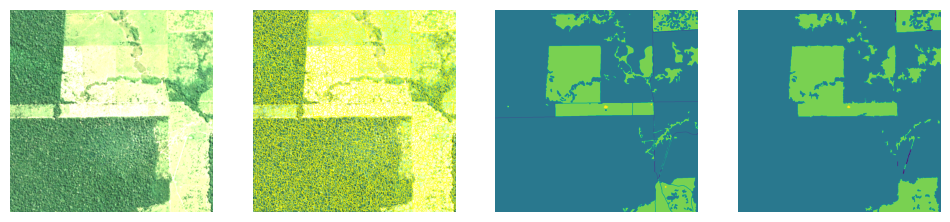

Kept classes in labels: [0 2 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 5047
Working on segment # 200 / 5047
Working on segment # 400 / 5047
Working on segment # 600 / 5047
Working on segment # 800 / 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.08728293710135197..12.896053956724753].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..12.896053956724753].


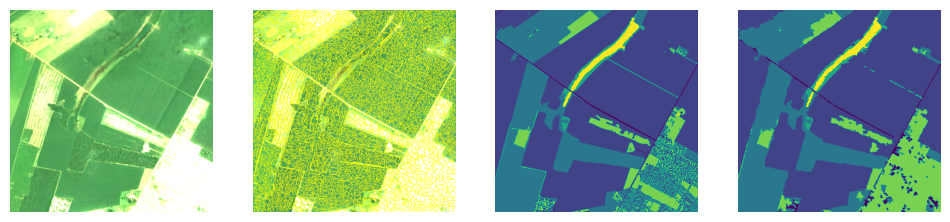

Kept classes in labels: [0 1 2 3 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4989
Working on segment # 200 / 4989
Working on segment # 400 / 4989
Working on segment # 600 / 4989
Working on segment # 80

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.12085329752494889..5.341044343394269].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..5.341044343394269].


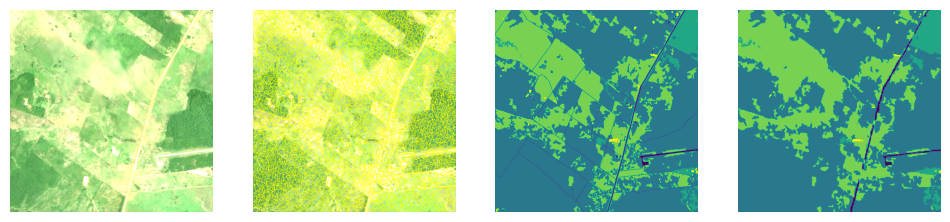

Kept classes in labels: [0 2 3 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 5074
Working on segment # 200 / 5074
Working on segment # 400 / 5074
Working on segment # 600 / 5074
Working on segment # 800 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.5236976226081118..3.543351542710654].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..3.543351542710654].


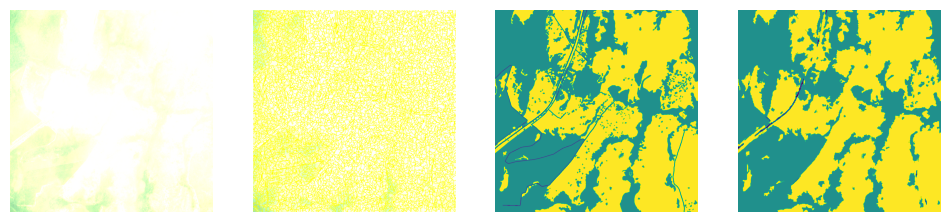

Kept classes in labels: [0 2 3 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 5123
Working on segment # 200 / 5123
Working on segment # 400 / 5123
Working on segment # 600 / 5123
Working on segment # 800 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.1510666219061861..4.449751274147771].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4.449751274147771].


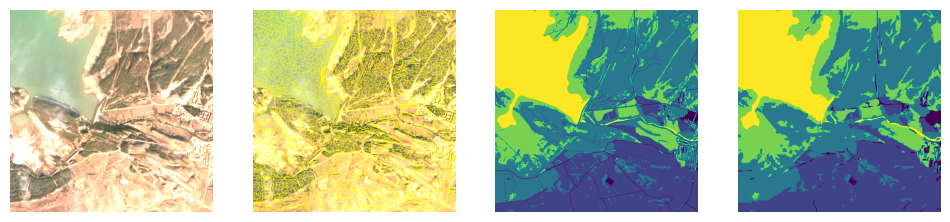

Kept classes in labels: [0 1 2 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4539
Working on segment # 200 / 4539
Working on segment # 400 / 4539
Working on segment # 600 / 4539
Working on segment # 800 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.06378368480483414..12.525101474044007].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..12.525101474044007].


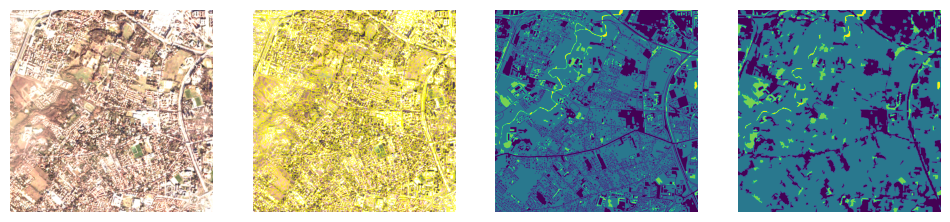

Kept classes in labels: [0 2 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4661
Working on segment # 200 / 4661
Working on segment # 400 / 4661
Working on segment # 600 / 4661
Working on segment # 800 / 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.9063997314371166..3.8874477370525224].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..3.8874477370525224].


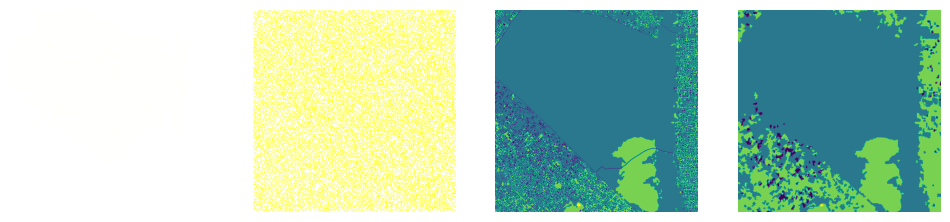

Kept classes in labels: [0 2 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 5241
Working on segment # 200 / 5241
Working on segment # 400 / 5241
Working on segment # 600 / 5241
Working on segment # 800 / 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.8577227088229011..7.363658558915982].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..7.363658558915982].


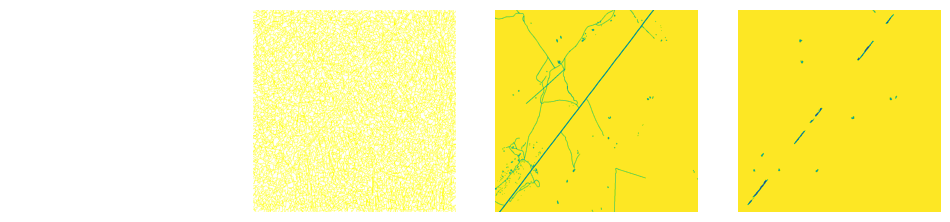

Kept classes in labels: [0 1 2 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 5045
Working on segment # 200 / 5045
Working on segment # 400 / 5045
Working on segment # 600 / 5045
Working on segment # 800 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1.3797418134098332..2.774590289010285].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..2.774590289010285].


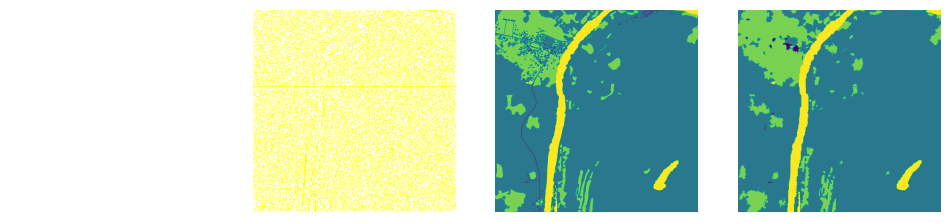

Kept classes in labels: [0 2 3 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 5454
Working on segment # 200 / 5454
Working on segment # 400 / 5454
Working on segment # 600 / 5454
Working on segment # 800 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.17960142826624348..16.783501693777275].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..16.783501693777275].


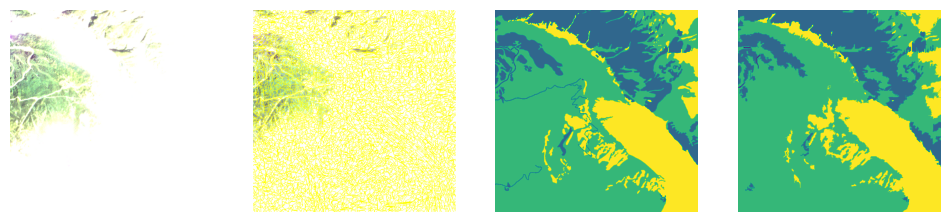

Kept classes in labels: [0 2 4 6]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4686
Working on segment # 200 / 4686
Working on segment # 400 / 4686
Working on segment # 600 / 4686
Working on segment # 800 / 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.40620136112552263..7.093417157506027].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..7.093417157506027].


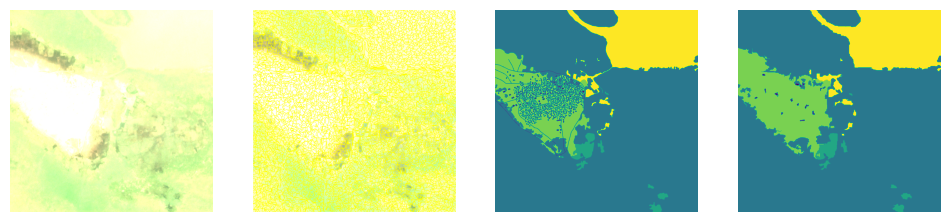

Kept classes in labels: [0 2 3 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 5094
Working on segment # 200 / 5094
Working on segment # 400 / 5094
Working on segment # 600 / 5094
Working on segment # 800 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.7586901455732902..4.745170445875424].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4.745170445875424].


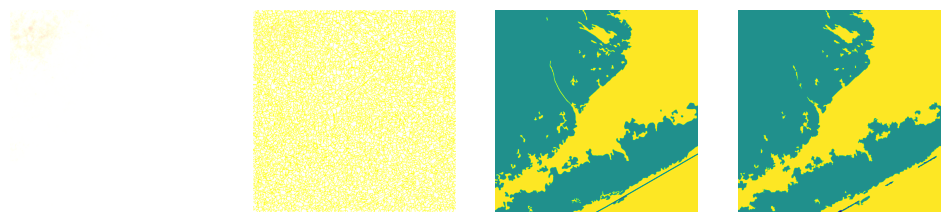

Kept classes in labels: [0 2 4]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 5049
Working on segment # 200 / 5049
Working on segment # 400 / 5049
Working on segment # 600 / 5049
Working on segment # 800 / 50

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.44145023957029944..11.027863399151585].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..11.027863399151585].


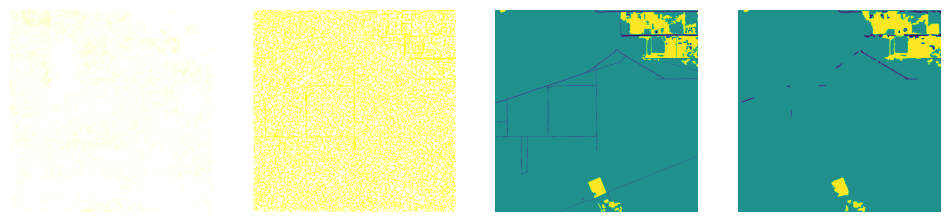

Kept classes in labels: [0 2 4]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4776
Working on segment # 200 / 4776
Working on segment # 400 / 4776
Working on segment # 600 / 4776
Working on segment # 800 / 47

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04699850459303567..15.647144993438522].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..15.647144993438522].


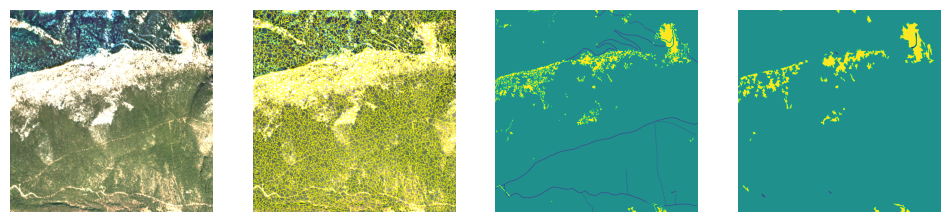

Kept classes in labels: [0 2 4]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4439
Working on segment # 200 / 4439
Working on segment # 400 / 4439
Working on segment # 600 / 4439
Working on segment # 800 / 44

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.3759880367442854..4.02340769676809].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4.02340769676809].


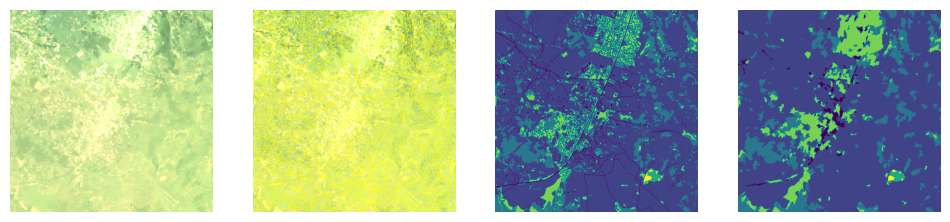

Kept classes in labels: [0 1 2 3 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4826
Working on segment # 200 / 4826
Working on segment # 400 / 4826
Working on segment # 600 / 4826
Working on segment # 80

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.34409619434186833..1.968901638843959].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.968901638843959].


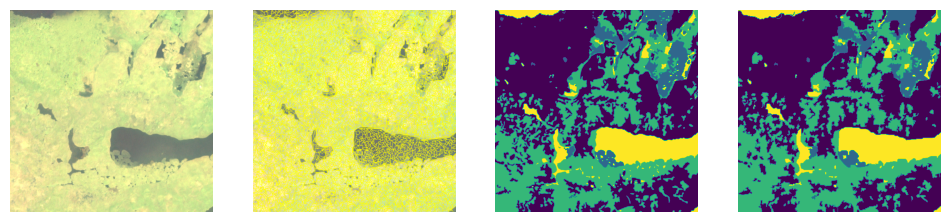

Kept classes in labels: [2 3 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4997
Working on segment # 200 / 4997
Working on segment # 400 / 4997
Working on segment # 600 / 4997
Working on segment # 800 / 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [2.4002807702871793..8.419446394238106].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..8.419446394238106].


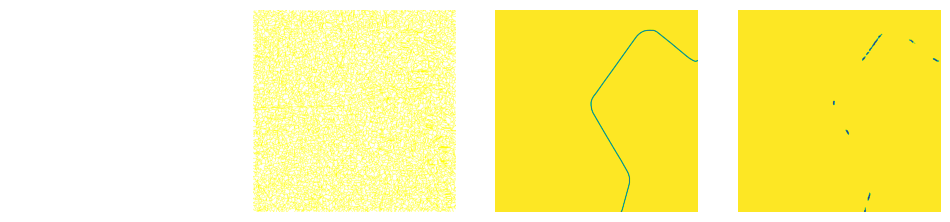

Kept classes in labels: [0 1 4]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 5000
Working on segment # 200 / 5000
Working on segment # 400 / 5000
Working on segment # 600 / 5000
Working on segment # 800 / 50

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.5824457533494065..6.317941831720939].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..6.317941831720939].


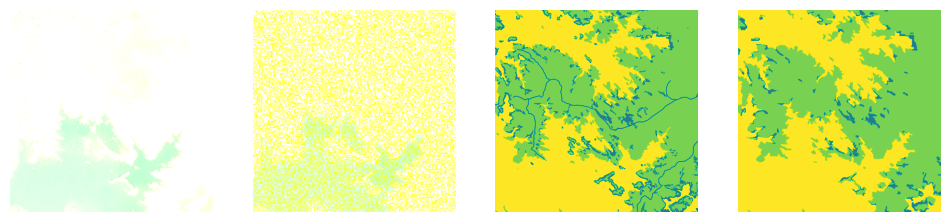

Kept classes in labels: [0 2 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4456
Working on segment # 200 / 4456
Working on segment # 400 / 4456
Working on segment # 600 / 4456
Working on segment # 800 / 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.3491317484054079..8.140812402722252].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..8.140812402722252].


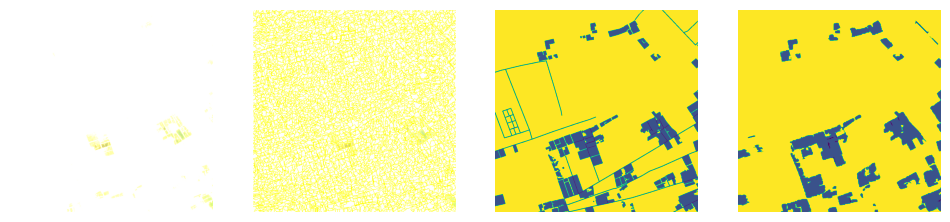

Kept classes in labels: [0 1 2 4]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4674
Working on segment # 200 / 4674
Working on segment # 400 / 4674
Working on segment # 600 / 4674
Working on segment # 800 / 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.14267403180028687..1.9168675801873838].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.9168675801873838].


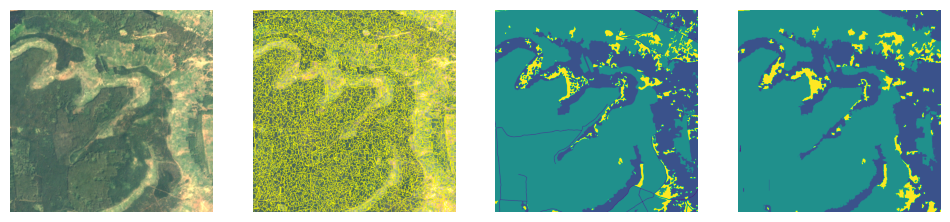

Kept classes in labels: [0 1 2 4]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4966
Working on segment # 200 / 4966
Working on segment # 400 / 4966
Working on segment # 600 / 4966
Working on segment # 800 / 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.3088473158970916..6.603289895321512].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..6.603289895321512].


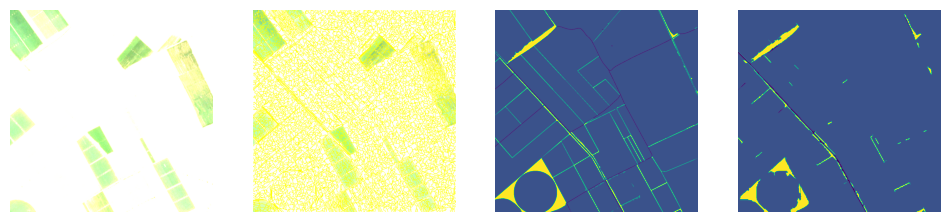

Kept classes in labels: [0 1 2 4]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4504
Working on segment # 200 / 4504
Working on segment # 400 / 4504
Working on segment # 600 / 4504
Working on segment # 800 / 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.4934842982268746..11.037934507278665].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..11.037934507278665].


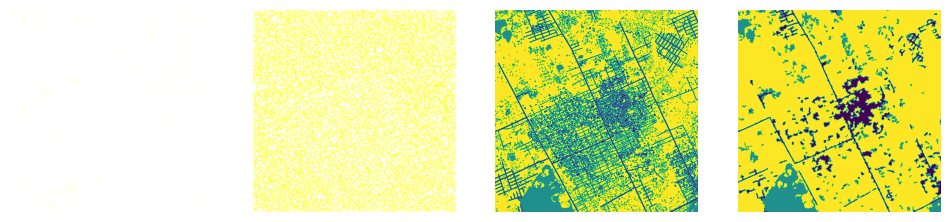

Kept classes in labels: [0 2 4]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4567
Working on segment # 200 / 4567
Working on segment # 400 / 4567
Working on segment # 600 / 4567
Working on segment # 800 / 45

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.21317178868984038..6.542863246559039].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..6.542863246559039].


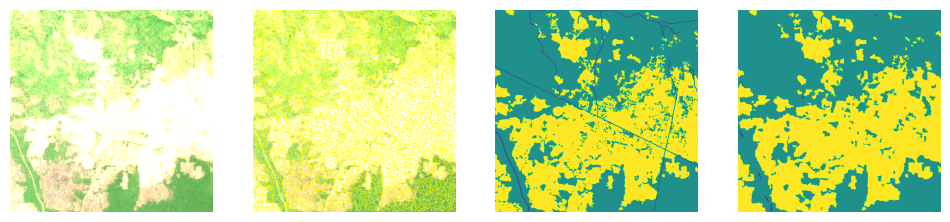

Kept classes in labels: [0 2 4]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4597
Working on segment # 200 / 4597
Working on segment # 400 / 4597
Working on segment # 600 / 4597
Working on segment # 800 / 45

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.3289895321512497..9.572588274788659].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..9.572588274788659].


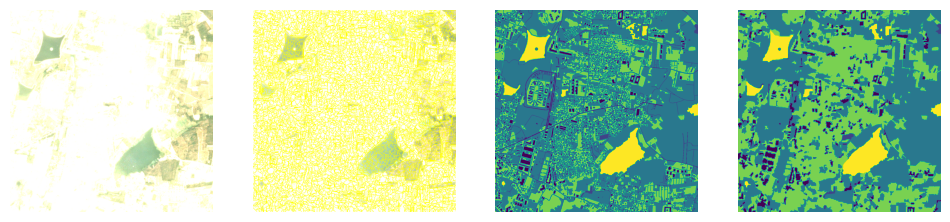

Kept classes in labels: [0 1 2 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4675
Working on segment # 200 / 4675
Working on segment # 400 / 4675
Working on segment # 600 / 4675
Working on segment # 800 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.6814783165990173..4.553819391460921].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4.553819391460921].


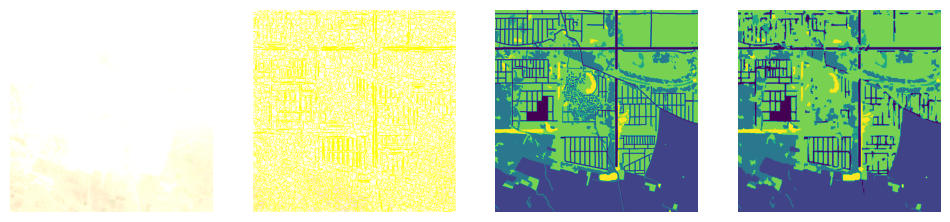

Kept classes in labels: [0 1 2 3 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4954
Working on segment # 200 / 4954
Working on segment # 400 / 4954
Working on segment # 600 / 4954
Working on segment # 80

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.42634357737968076..8.876003295999023].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..8.876003295999023].


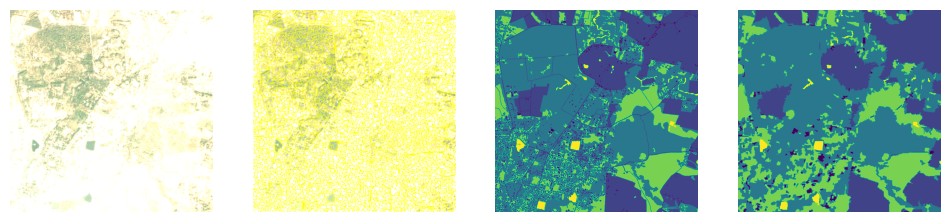

Kept classes in labels: [0 1 2 3 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3
Working on time frame # 4
Working on time frame # 5
Working on time frame # 6
Working on time frame # 7
Working on time frame # 8
Working on time frame # 9
Working on time frame # 10
Working on time frame # 11
Working on time frame # 12
Working on time frame # 13
Working on time frame # 14
Working on time frame # 15
Working on time frame # 16
Working on time frame # 17
Working on time frame # 18
Working on time frame # 19
Working on time frame # 20
Working on time frame # 21
Working on time frame # 22
Working on time frame # 23
Creating graphs based on temporal connections...
Graphs will have channel_avg features
Working on time frame # 0
Working on segment # 0 / 4867
Working on segment # 200 / 4867
Working on segment # 400 / 4867
Working on segment # 600 / 4867
Working on segment # 80

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.040284432508316294..4.446394238105412].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4.446394238105412].


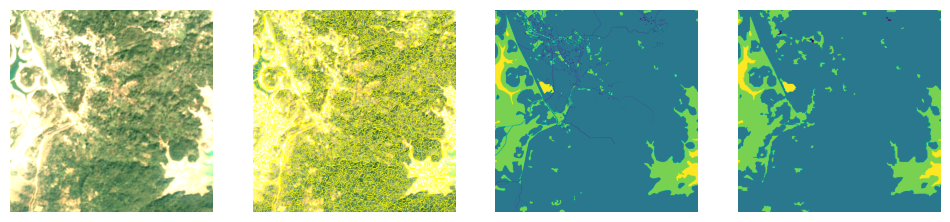

Kept classes in labels: [0 2 3 4 5]
Starting graph creation...
Connecting regions through time...
Number of time frames: 24
Working on time frame # 1
Working on time frame # 2
Working on time frame # 3


In [ ]:
for i_row, row in enumerate(dataset_json):        
    print("Working on #", str(i_row + 1), "/", len(dataset_json), ":", row['new_folder_name'])
    
    raw = []
    labels = []

    # Create save folder
    segmentation_parameters_string_to_append = "_sc_" + str(scale) + "_sigma_" + str(sigma) + "_min_size_" + str(min_size)
    folder_path = "./prepared_data/interval_" + keep_interval + "_padding_" + str(around_region_padding_amount) + "_bbox_size_" + str(desired_img_size) +"_layers_" + RGB_or_RGB_plus_near_INFRARED + segmentation_parameters_string_to_append + "/" + row['split'] + "/" + row['new_folder_name']

    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
        print(f"Folder '{folder_path}' was created.")
    else:
        print(f"Folder '{folder_path}' already exists.")

    # Read all raw and labels images
    raw_data_path = "../../../../prepared_dynamic_earth_net_data/" + row['split'] + "/" + row['new_folder_name'] + "/image"
    labels_data_path = "../../../../prepared_dynamic_earth_net_data/" + row['split'] + "/" + row['new_folder_name'] + "/label"
        
    raw_file_names = natsorted([f for f in listdir(raw_data_path) if isfile(join(raw_data_path, f))])
    labels_file_names = natsorted([f for f in listdir(labels_data_path) if isfile(join(labels_data_path, f))])

    label_indices_with_actual_labels = []
    if keep_interval == "monthly":
        monthly_label_image_index = 0
    for i_row_index, _ in enumerate(labels_file_names):
        if keep_interval == "monthly":
            if _.split(".")[0] in dates_with_labels:
                label_indices_with_actual_labels.append(monthly_label_image_index)
                monthly_label_image_index += 1
            
                raw_image = np.load(raw_data_path + "/" + raw_file_names[i_row_index])
                label_image = np.load(labels_data_path + "/" + labels_file_names[i_row_index])
                raw.append(raw_image)
                labels.append(label_image)

    raw = np.array(raw, dtype=raw[0].dtype)
    labels = np.array(labels, dtype=labels[0].dtype)
    print("Read raw shape:", raw.shape, "/ read labels shape:", labels.shape)
    print("Classes in labels", np.unique(labels))

    # Run segmentation of all images across all image layers
    print("Running segmentation...")
    segmentation_masks, segmentation_masks_num_of_segments = segment_images(raw, ratio=None, kernel_size=None, max_dist=None, return_tree=None, sigma=sigma, convert2lab=None, rng=None, longest_image_dimension = None, k=None, beta=None, epsilon=None, use_quickshift_plus_plus = False, use_felzenszwalb = True, use_SLIC = False, scale=scale, min_size=min_size, n_segments=None, compactness=None, max_num_iter=None)

    # Save segmentation masks
    save_item_with_pickle(segmentation_masks, folder_path + "/segmentation_masks.pickle")
    save_item_with_pickle(segmentation_masks_num_of_segments, folder_path + "/segmentation_masks_num_of_segments.pickle")
    
    # Keep selected layers
    if RGB_or_RGB_plus_near_INFRARED == "only_rgb":
        raw = raw[:,:,:,[0,1,2]]

    # Correct labels for training with our proposed method
    print("Correcting labels for indices:", label_indices_with_actual_labels)
    corrected_labels_for_our_method = np.array(labels[label_indices_with_actual_labels], dtype=labels.dtype)

    print("Performing argmax on labels...")
    argmax_corrected_labels_for_our_method = perform_argmax_labels(corrected_labels_for_our_method, segmentation_masks[label_indices_with_actual_labels])

    # Plot some images
    fig, axes = plt.subplots(1, 4, figsize=(12, 3))  # Adjust the figure size as needed

    axes[0].imshow((raw[0] / 32767.0)[:,:,[0,1,2]] * 55)
    axes[0].axis("off")

    axes[1].imshow(mark_boundaries(((raw[0] / 32767.0))[:,:,[0,1,2]] * 55, segmentation_masks[0]))
    axes[1].axis("off")
    
    axes[2].imshow(labels[0])
    axes[2].axis("off")

    labels[label_indices_with_actual_labels] = argmax_corrected_labels_for_our_method

    axes[3].imshow(labels[0])
    axes[3].axis("off")
    plt.show()

    print("Kept classes in labels:", np.unique(labels))

    # Run graph creation
    segmentations_mask_plus_1_label = np.array(segmentation_masks) + 1

    print("Starting graph creation...")
    # Connect regions through time
    print("Connecting regions through time...")
    connections, weights = create_time_series_graphs(segmentations_mask_plus_1_label, segmentation_masks_num_of_segments, split_percantage=0.0, classification_masks = labels)

    # Create graphs based on temporal connections
    print("Creating graphs based on temporal connections...")
    graphs = get_all_possible_graphs_fast(connections, weights, segmentation_masks, segmentation_masks_num_of_segments, raw=None, classification_masks=labels, feature_type = "channel_avg", mask_segments_with_zeros = False, around_region_padding_amount = around_region_padding_amount)

    # Add spatial connections to the graphs
    print("Adding spatial connections to the graph......")
    graphs = add_spatial_connections_to_graphs(graphs, segmentation_masks, segmentation_masks_num_of_segments)

    # Join graphs based on connections (output will be a single graph, because of included spatial connections)
    print("Joining graphs based on connections.....")
    joined_graphs = join_graphs_if_joint_nodes(graphs, check_interval=100, graphs_checked_interval = 25000)

    # Place graphs (or a single graph) inside a singular graph
    print("Joining graphs into a single graph.....")
    joined_single_graph = compose_all(joined_graphs)

    # Set raw features (i.e. cropped bounding box images) for each node inside the singular graph
    print("Setting raw features for each node inside the graph.....")
    updated_single_graph = update_nx_graph_features(joined_single_graph, segmentation_masks, segmentation_masks_num_of_segments, raw=raw, feature_type="raw", bow_dictionaries=None, mask_segments_with_zeros = False, around_region_padding_amount = around_region_padding_amount, desired_img_size=desired_img_size, dtype=np.float16)

    print("Classes in graph:", np.unique(list(nx.get_node_attributes(updated_single_graph, "label").values())))
    print("Number of nodes in graph:", updated_single_graph.number_of_nodes())

    # Save graph with pickle
    print("Saving graph.....")
    pd.to_pickle(updated_single_graph, folder_path + '/graph.pickle')